## Aims

So I started an international flight without a 1 min resolution copy of the Bedrock data... So this is a chance to compare the other data sets I do have.

My download included a map called PSL which, for the life of me, I cannot remember what it is. Possible Population + Sea Level? Let's find out. In the past when I did population-based algorithms would run into issues with empty pixels -- the algorithms didn't know what to do with them.

So the plan for this notebook will be to:

* **[done]** Fix offset of the 1min POP map so we can load it
* Generate maps based on PSL and POP to try out what they look like
* Generate new data layers with the population data. There are a few different ways to go about this:
  * Pixel distance from nearest Population data
  * Some weighted function away from population (eg. have cities radiate more strongly than isolated communities)
  * Fill in the banks with elevation -- coastlines are easy to colonize, going out to see or up mountains is harder
* Visualize maps with mixed input elevation + population

In [4]:
## Setup
import numpy as np
from src import map_partition, map_transforms

%config InlineBackend.figure_format = 'retina'

/Users/conradarcturus/Documents/GitHub/mapalgo/src/map_image.py:189: RuntimeWarning: invalid value encountered in divide
  sea /= np.max(sea)


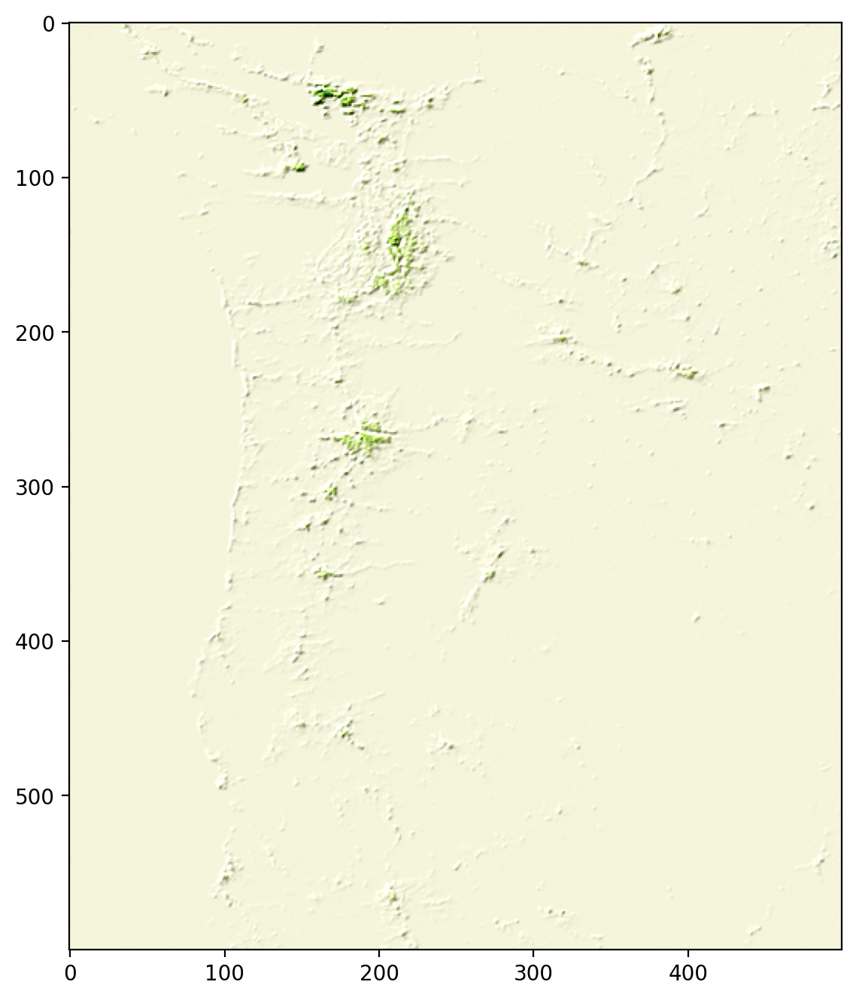

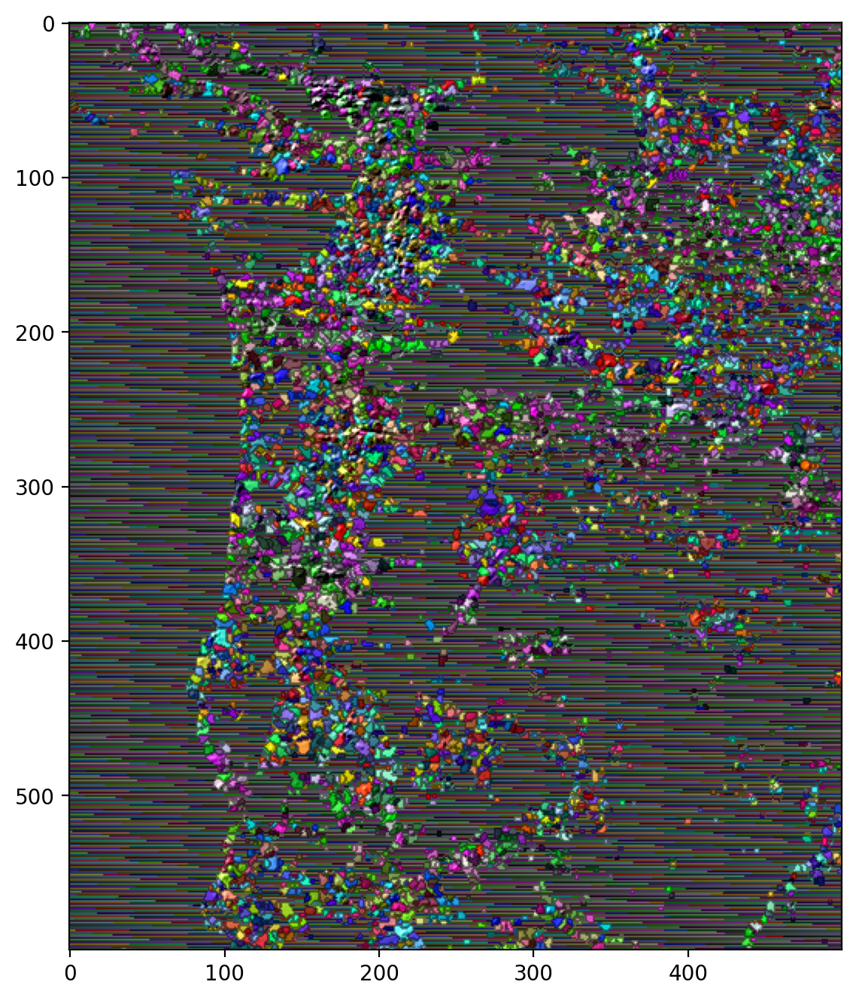

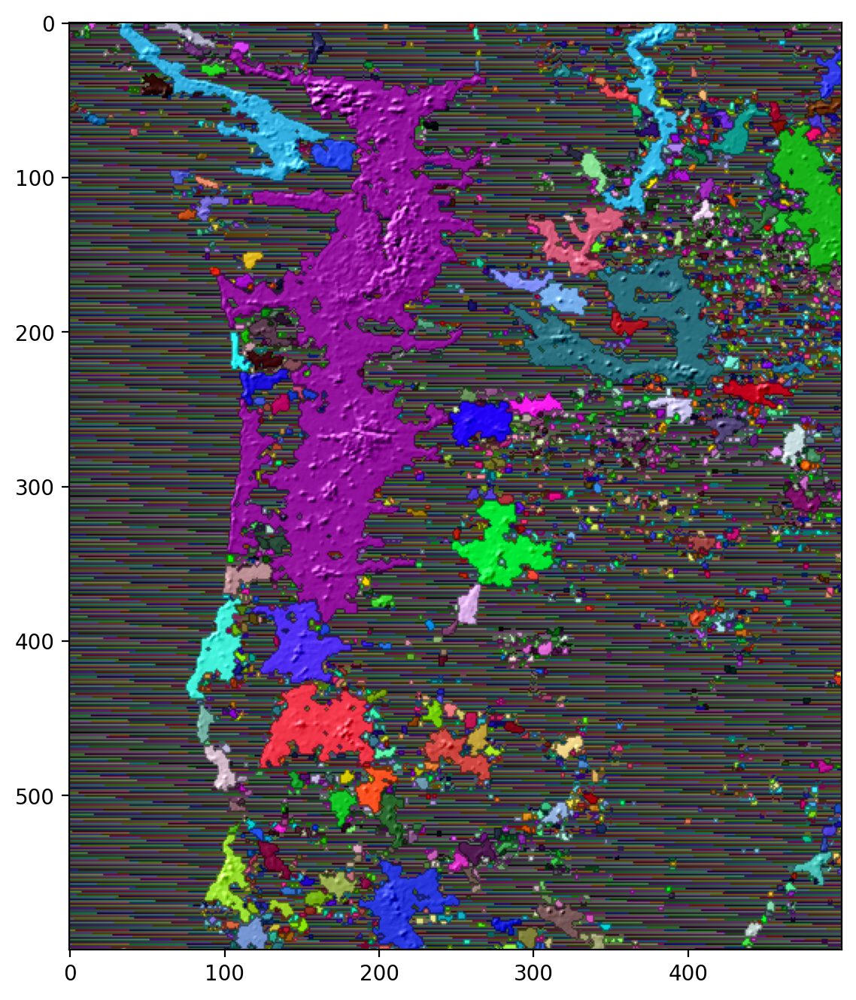

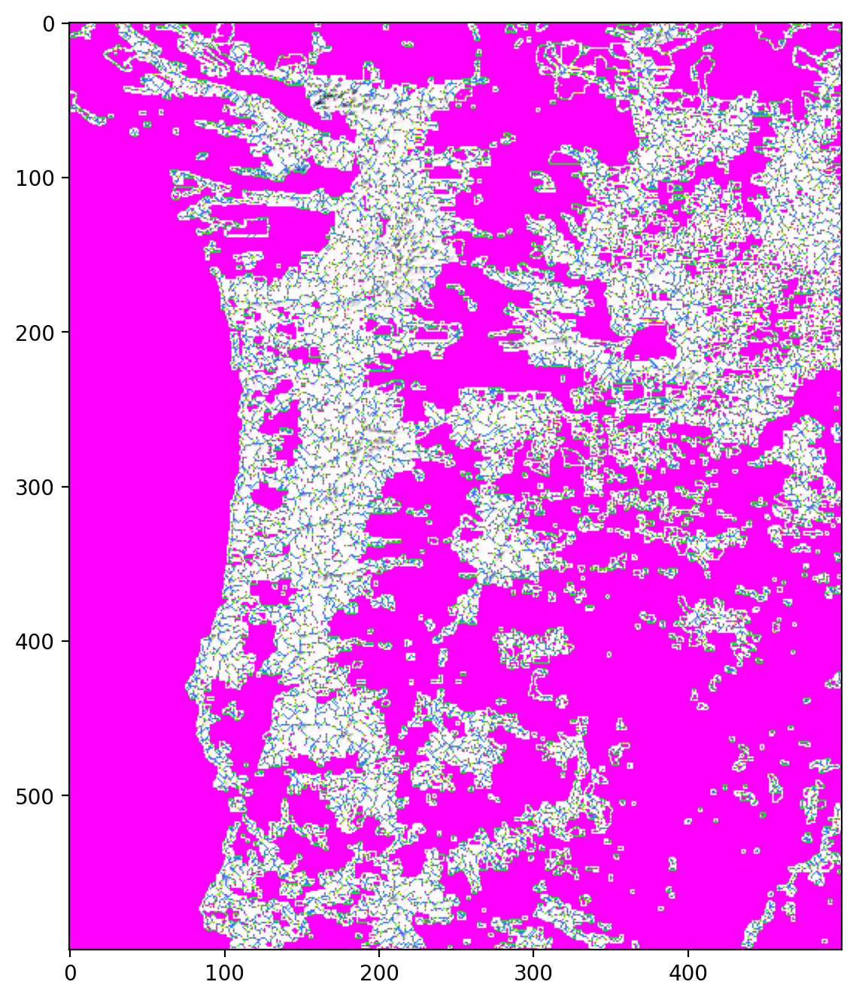

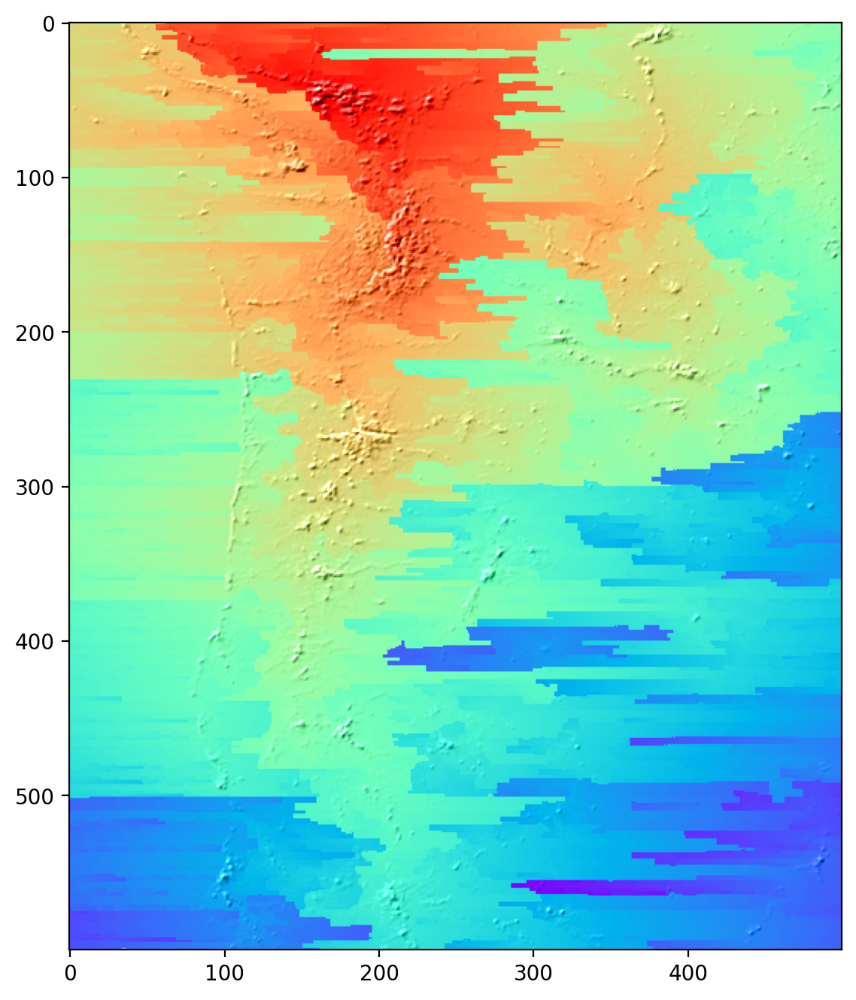

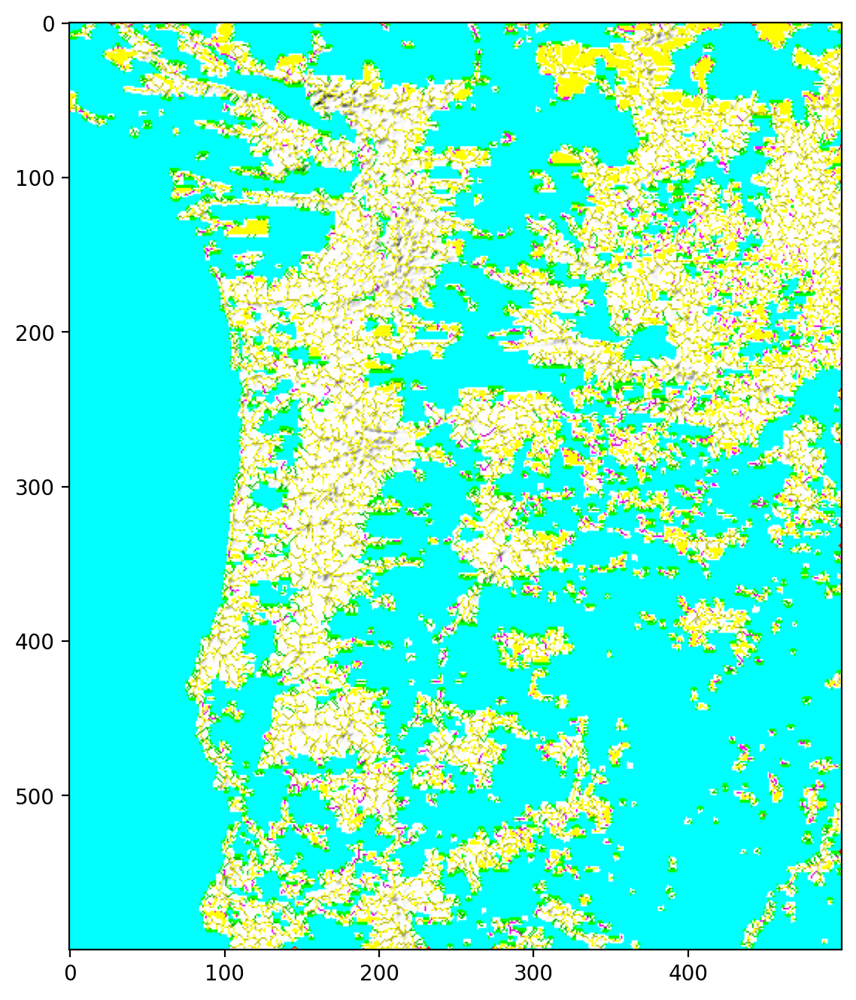

pop_1min_cascadia_contiguous_urban_areas.png


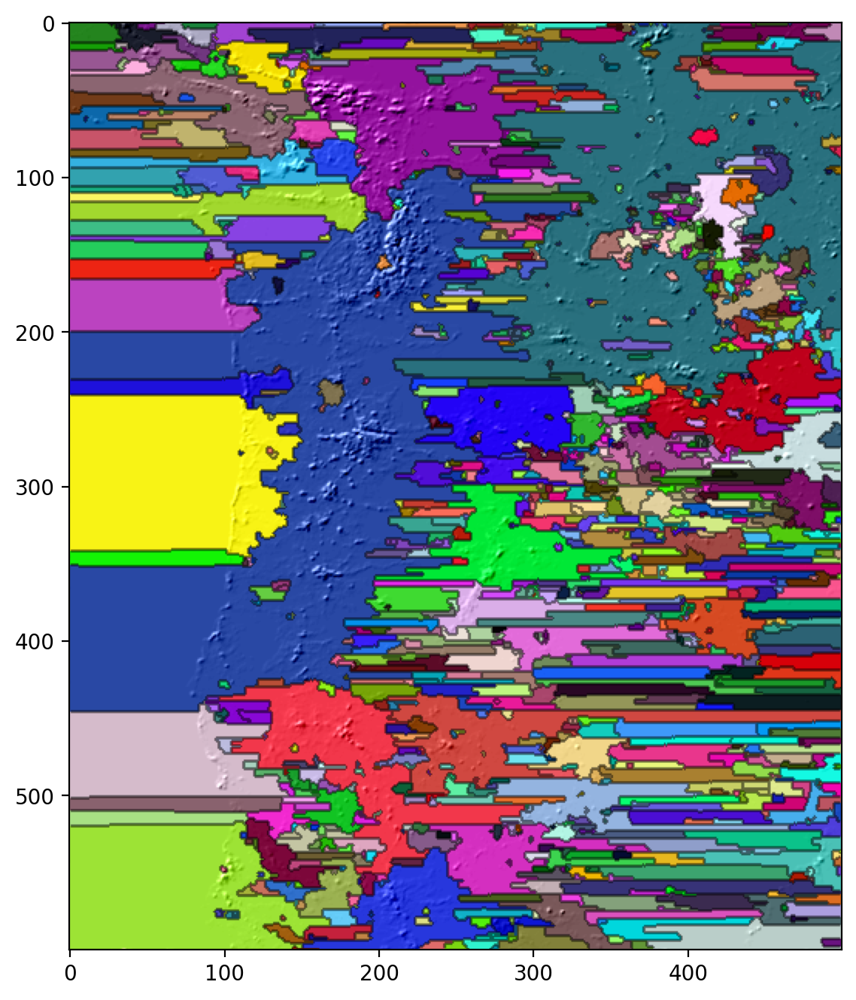

In [6]:
LP = map_partition.LocalePartition(dataset='POP', region='cascadia', minutes_per_node=1, image_folder='img/05/', flow_direction='up')
LP.computeStandardDivisionInformation(print_stats=False, draw_all_images=True)
nodes_division_sealevel = LP.drawDivisionsAcrossSeaLevel(print_filenames=True, display_images=True, final_analysis_filename=True)

(relic from a first attempt, kept in to leave some code snippets)

Ahhh, the population data in the 1 minute file does not start at 90 degrees north -- it starts at an offset. Let me change the file so it can be loaded in like the rest

In [105]:
### Generate the data
### breaking down the original functions in map_data and map_partition
### so we can see what the 1min resolution looks like

# Load the data and move it by an offset since the original data didn't include the polar region so the matrix just started later
from src import map_data, map_transforms, map_image, map_instance

# Mock the "self" variable used in map_data.py
class MapInfo():
    region = 'cascadia'
    dataset = 'POP'
    minutes_per_node = 1
    image_folder = 'img/05/'
    
self =  MapInfo()
maps = {}

data_file = open('data/{}_beforeoffset_world_{}min.npz'.format(self.dataset, self.minutes_per_node), 'rb')
data_2d = np.load(data_file)['data_matrix']
data_file.close()

# Set attributes for the map data
attributes = {
    'minutes_per_node': self.minutes_per_node,
    'dataset': self.dataset.lower(),
    'image_folder': self.image_folder,
    'region': 'world',
}

# Build the map instance that keeps metadata
[n_rows, n_cols] = data_2d.shape
self.n_rows = n_rows
self.n_cols = n_cols
maps['elevation'] = map_instance.MapInstance(attributes, n_rows, n_cols, data_2d.flatten())


# data_pop_with_negative_no_pop = maps['elevation'].getDataFlat()
# data_pop_with_negative_no_pop[data_pop_with_negative_no_pop == 0] = -1
# maps['elevation'] = maps['elevation'].setData(data_pop_with_negative_no_pop) 
# maps['hillshade'] = map_transforms.getHillshade(maps['elevation'], 1)
# maps['sea']  = maps['elevation'].newChildInstance(
#     {'values': 'zero_pop'},
#     maps['elevation'].getDataFlat() < 0,
# )
# maps['coast'] = map_transforms.getBorder(maps['sea'], 1)
# self.maps = maps
# image_base = map_image.RasterImage(self.maps['elevation']) \
#             .addLayer('base', 1) \
#             .addLayer('sea', 1.2, nodes_selected=self.maps['sea'].getDataFlat(), combine='add', dissolve=.2) \
#             .addLayer('hillshade', self.maps['hillshade'].getDataFlat(), combine='add', opacity=1, dissolve=1) \
#             .addLayer('coast', 0.2, nodes_selected=self.maps['coast'].getDataFlat(), combine='multiply')
# image_base.display().save().final()

In [107]:
# See the height

data_2d.shape[0]

8700

In [109]:
# Create a new data array
new_data_2d = np.zeros([data_2d.shape[1]//2, data_2d.shape[1]], dtype=int)
height_offset = 300 ## I think this is right, and yes! it turns out to be the right offset, it's basically 5 degrees (5 * 60 minutes)
height_end = height_offset + data_2d.shape[0]
new_data_2d[height_offset:height_end, :] = data_2d
new_data_2d.shape

(10800, 21600)

In [24]:
### Visualize it

# Set attributes for the map data
attributes = {
    'minutes_per_node': self.minutes_per_node,
    'dataset': self.dataset.lower(),
    'image_folder': self.image_folder,
    'region': 'world',
}

# Build the map instance that keeps metadata
[n_rows, n_cols] = new_data_2d.shape
self.n_rows = n_rows
self.n_cols = n_cols
maps['elevation'] = map_instance.MapInstance(attributes, n_rows, n_cols, new_data_2d.flatten())


data_pop_with_negative_no_pop = maps['elevation'].getDataFlat()
data_pop_with_negative_no_pop[data_pop_with_negative_no_pop == 0] = -1
maps['elevation'] = maps['elevation'].setData(data_pop_with_negative_no_pop) 
maps['hillshade'] = map_transforms.getHillshade(maps['elevation'], 1)
maps['sea']  = maps['elevation'].newChildInstance(
    {'values': 'zero_pop'},
    maps['elevation'].getDataFlat() < 0,
)
maps['coast'] = map_transforms.getBorder(maps['sea'], 1)
self.maps = maps
image_base = map_image.RasterImage(self.maps['elevation']) \
            .addLayer('base', 1) \
            .addLayer('sea', 1.2, nodes_selected=self.maps['sea'].getDataFlat(), combine='add', dissolve=.2) \
            .addLayer('hillshade', self.maps['hillshade'].getDataFlat(), combine='add', opacity=1, dissolve=1) \
            .addLayer('coast', 0.2, nodes_selected=self.maps['coast'].getDataFlat(), combine='multiply')
# image_base.display().save().final()

In [115]:
data_file = open('data/{}_world_{}min.npz'.format(self.dataset, self.minutes_per_node), 'wb')
np.save(data_file, new_data_2d) ## Can we compress this?
data_file.close()



In [117]:
data_file = open('data/{}_world_{}min.npz'.format(self.dataset, self.minutes_per_node), 'rb')
d = np.load(data_file)
data_file.close()

In [95]:
data_file = open('data/{}_world_{}min.npz'.format(self.dataset, self.minutes_per_node), 'rb')
data_2d = np.load(data_file)
if not isinstance(d, np.ndarray):
    data_2d = data_2d['data_matrix']
data_file.close()

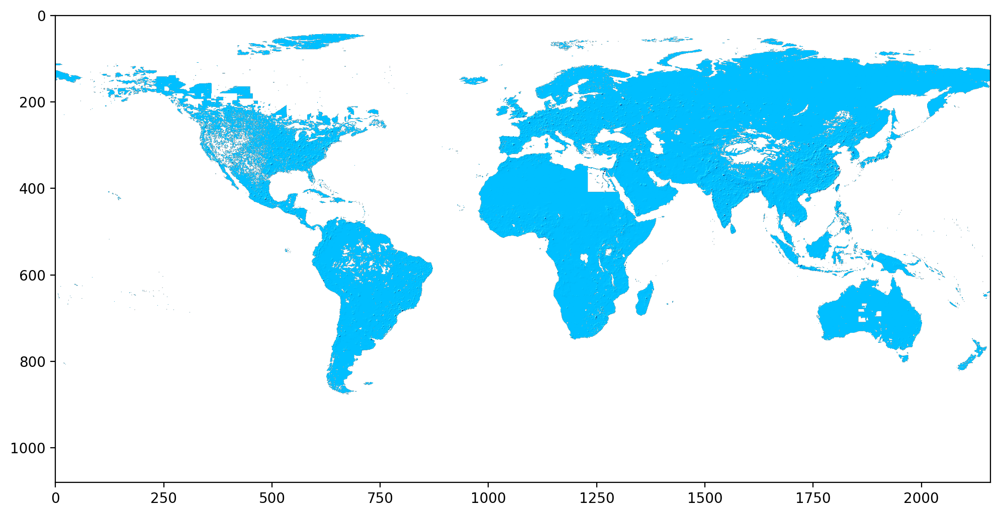

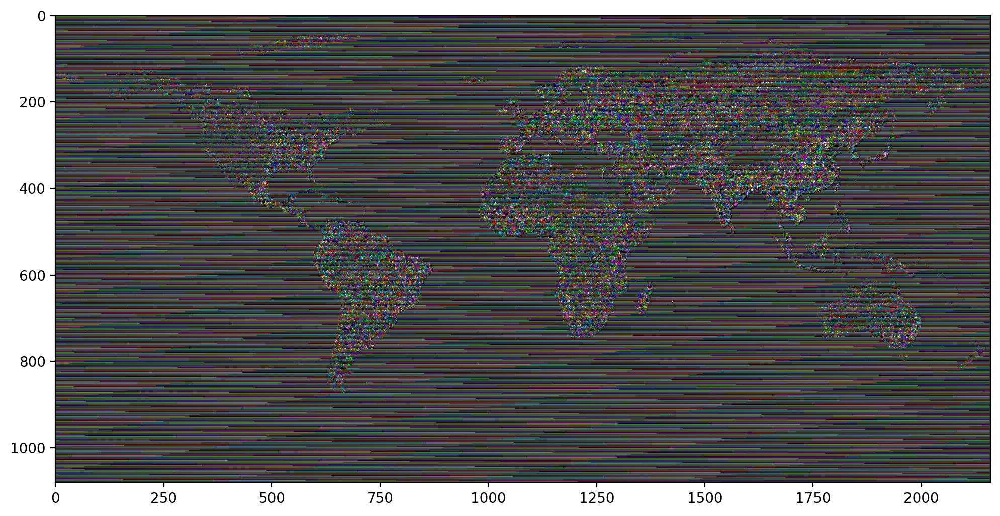

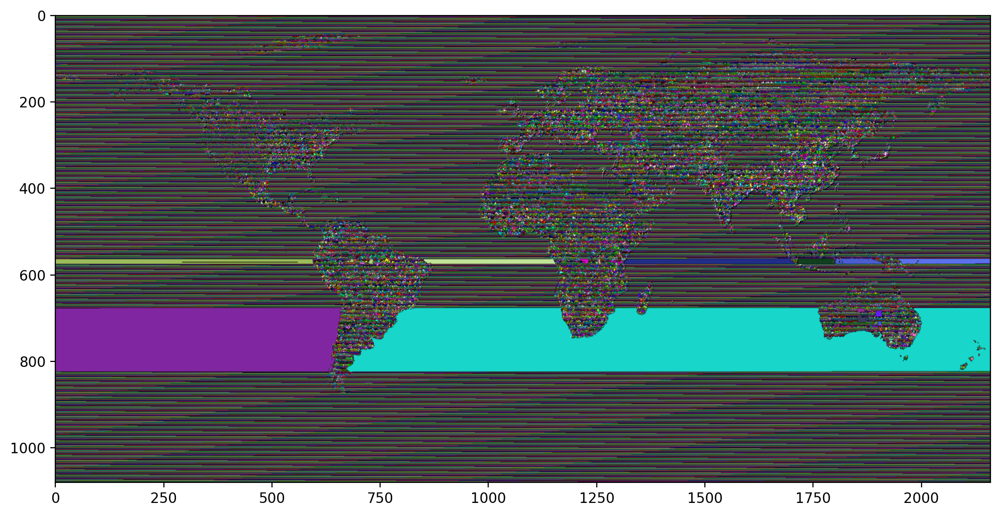

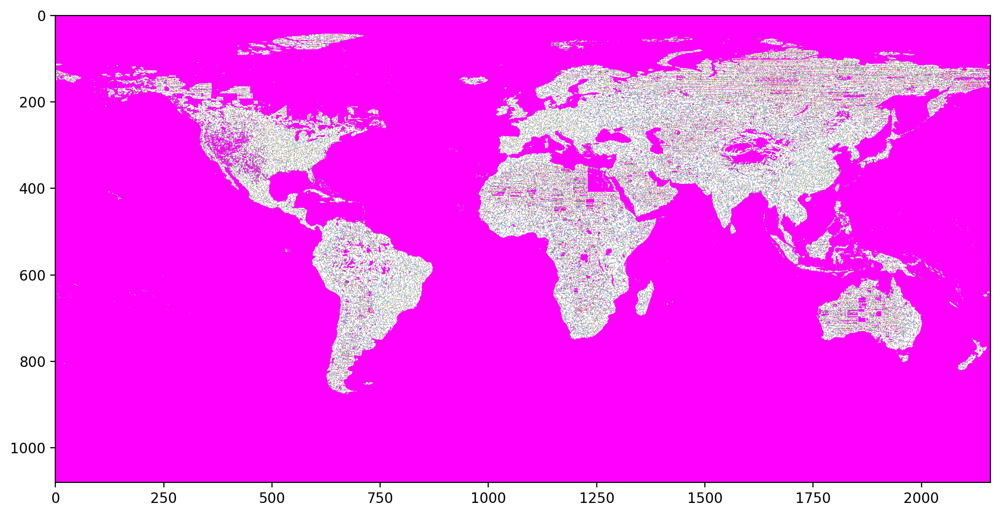

KeyboardInterrupt: 

In [8]:
## Generate the other prototypical_maps

def getLocalePartitions(dataset, region, minutes_per_node):
    # up (islands, )
    LP = map_partition.LocalePartition(dataset=dataset, region=region, minutes_per_node=minutes_per_node, image_folder='img/05/', flow_direction='up')
    LP.computeStandardDivisionInformation(print_stats=False, draw_all_images=True)
    nodes_division_sealevel = LP.drawDivisionsAcrossSeaLevel(print_filenames=True, display_images=True, final_analysis_filename=True)
    
    # down (drainage basins, voids)
    LP = map_partition.LocalePartition(dataset=dataset, region=region, minutes_per_node=minutes_per_node, image_folder='img/05/', flow_direction='down')
    LP.computeStandardDivisionInformation(print_stats=False, draw_all_images=True)
    nodes_division_sealevel = LP.drawDivisionsAcrossSeaLevel(print_filenames=True, display_images=True, final_analysis_filename=True)

getLocalePartitions('POP', 'hawaii', 1)
getLocalePartitions('POP', 'cascadia', 1)
getLocalePartitions('POP', 'world', 10)